## Clone the Entire Repository in Colab

In [2]:
!git clone https://github.com/patitimoner/workshop-chihuahua-vs-muffin.git

%cd workshop-chihuahua-vs-muffin

!ls

Cloning into 'workshop-chihuahua-vs-muffin'...
remote: Enumerating objects: 337, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 337 (delta 1), reused 4 (delta 1), pack-reused 330 (from 1)
Receiving objects: 100% (337/337), 14.51 MiB | 11.37 MiB/s, done.
Resolving deltas: 100% (82/82), done.
/content/workshop-chihuahua-vs-muffin/workshop-chihuahua-vs-muffin
'CNN_1 Chihuahua or Muffin.ipynb'   README.md   workshop_1.ipynb
 data				    resources   workshop_1_output.ipynb


# I.  Project Overview

<center><img src="https://github.com/patitimoner/workshop-chihuahua-vs-muffin/blob/master/resources/preview.jpg?raw=1" width="700"></center>

In this project, we'll build a neural network classifier that determines: **MUFFIN... or CHIHUAHUA!**

This is what we'll cover in the tutorial:
#### 1) Build the neural network
#### 2) Load the data
#### 3) Train the model on the data
#### 4) Visualize the results

### Remember: This is an INTERACTIVE Notebook!
You should run and play with the code as you go to see how it works. Select a cell and **press shift-enter to execute code.**

<img src="https://github.com/patitimoner/workshop-chihuahua-vs-muffin/blob/master/resources/jupyter_animated.gif?raw=1" width="700">

# II.  Deep Learning Tutorial

Let's get to the fun stuff!



<center><img src="https://github.com/patitimoner/workshop-chihuahua-vs-muffin/blob/master/resources/Pytorch_logo.png?raw=1" width="700"></center>

**Generic Python imports** (select the below cell and press shift-enter to execute it)

In [3]:
import matplotlib.pyplot as plt  # graphical library, to plot images
# special Jupyter notebook command to show plots inline instead of in a new window
%matplotlib inline

**Deep learning imports**

In [4]:
import torch                                            # PyTorch deep learning framework
from torchvision import datasets, models, transforms    # extension to PyTorch for dataset management
import torch.nn as nn                                   # neural networks module of PyTorch, to let us define neural network layers
from torch.nn import functional as F                    # special functions
import torch.optim as optim                             # optimizers

## (1) Build our Neural Network

Recall from the lesson that a neural network generally looks like this. Input is on the left, output is on the right. The number of output neurons correspond to the number of classes.

<img src="https://github.com/patitimoner/workshop-chihuahua-vs-muffin/blob/master/resources/what_is_nn_slide.jpg?raw=1" width="700">

So let's define a similar architecture for our 2-class muffin-vs-chihuahua classifier:

In [5]:
#define image height and width
input_height = 224
input_width = 224

# Extends PyTorch's neural network baseclass
class MySkynet(nn.Module):
    """
    A very basic neural network.
    """
    def __init__(self, input_dim=(3, input_height, input_width)):
        """
        Constructs a neural network.

        input_dim: a tuple that represents "channel x height x width" dimensions of the input
        """
        super().__init__()
        # the total number of RGB pixels in an image is the tensor's volume
        num_in_features = input_dim[0] * input_dim[1] * input_dim[2]
        # input layer
        self.layer_0 = nn.Linear(num_in_features, 128)
        # hidden layers
        self.layer_1 = nn.Linear(128, 64)
        self.layer_2= nn.Linear(64, 32)
        # output layer, output size of 2 for chihuahua and muffin
        self.layer_3= nn.Linear(32, 2)

    def forward(self, x):
        """
        Define the forward pass through our network.
        """
        batch_size = x.shape[0]
        # convert our RGB tensor into one long vector
        x = x.view(batch_size, -1)

        # pass through our layers
        x = F.relu(self.layer_0(x))
        x = F.relu(self.layer_1(x))
        x = F.relu(self.layer_2(x))
        x = F.relu(self.layer_3(x))

        # convert the raw output to probability predictions
        x = F.softmax(x, dim=1)

        return x

Now that we've defined the network above, let's initialize it. If available, we'll place the network on the GPU; if not, it goes on the CPU.

In [6]:
 # cuda:0 means the first cuda device found
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = MySkynet().to(device)                      # load our simple neural network
model

MySkynet(
  (layer_0): Linear(in_features=150528, out_features=128, bias=True)
  (layer_1): Linear(in_features=128, out_features=64, bias=True)
  (layer_2): Linear(in_features=64, out_features=32, bias=True)
  (layer_3): Linear(in_features=32, out_features=2, bias=True)
)

Essentially, our network looks like this:
<img src="https://github.com/patitimoner/workshop-chihuahua-vs-muffin/blob/master/resources/architecture.png?raw=1" width="600">

## (2) Data and Data Loading

### Separate "train" and "test" datasets

Recall from the below slide, we should make two separate datasets to train and test our model. That way, we know our model learns more than rote memorization.

<center><img src="https://github.com/patitimoner/workshop-chihuahua-vs-muffin/blob/master/resources/when_is_your_model_ready_slide.jpg?raw=1" width="600"></center>

### Inspect our data
Let's look in our data folder to see what's there. As you can see, the folder is **split into "train" for training**, and **"validation" for testing** (to validate our model).

In [7]:
import os  # interact with the os. in our case, we want to view the file system

print("Data contents:", os.listdir("data"))
print("Train contents:", os.listdir("data/train"))
print("Validation contents:", os.listdir("data/validation"))

Data contents: ['train', 'validation']
Train contents: ['chihuahua', 'muffin']
Validation contents: ['chihuahua', 'muffin']


Let's also look at some of the images:

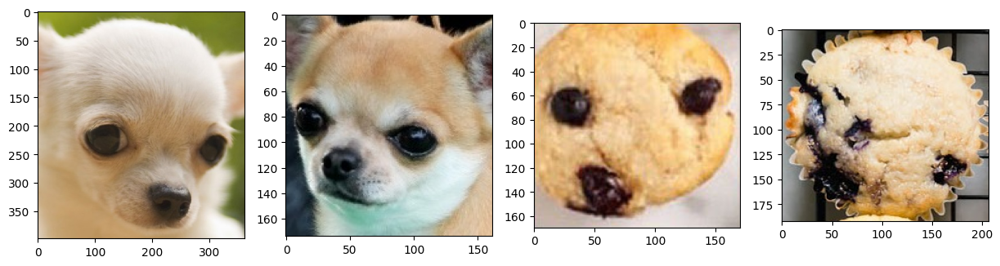

In [8]:
from PIL import Image  # import our image opening tool

_, ax = plt.subplots(1, 4, figsize=(15,60))  # to show 4 images side by side, make a "1 row x 4 column" axes
ax[0].imshow(Image.open("data/train/chihuahua/4.jpg"))  # show the chihuahua in the first column
ax[1].imshow(Image.open("data/train/chihuahua/5.jpg"))  # show the chihuahua in the second column
ax[2].imshow(Image.open("data/train/muffin/131.jpg"))   # show the muffin in the third column
ax[3].imshow(Image.open("data/train/muffin/107.jpg"))   # show the muffin in the fourth column


If you look in the data folder on your computer, there are 120 train images and 30 validation. So our data is split like this:

<img src="https://github.com/patitimoner/workshop-chihuahua-vs-muffin/blob/master/resources/folders.png?raw=1" width="600">

### Load our data

That's great that we have data! But we have to load all the images and convert them into a form that our neural network understands. Specifically, PyTorch works with **Tensor** objects. (A tensor is just a multidimensional matrix, i.e. an N-d array.)

<img src="https://github.com/patitimoner/workshop-chihuahua-vs-muffin/blob/master/resources/image_to_tensor.jpg?raw=1" width="550">


**To easily convert our image data into tensors, we use the help of a "dataloader."** The dataloader packages data into convenient boxes for our model to use. You can think of it like one person passing boxes (tensors) to another.
<img src="https://github.com/patitimoner/workshop-chihuahua-vs-muffin/blob/master/resources/dataloader_box_analogy.jpg?raw=1" width="400">

**First, we define some "transforms" to convert images to tensors.** We must do so for both our train and validation datasets.

For more information about transforms, check out the link here: https://pytorch.org/docs/stable/torchvision/transforms.html

In [9]:
normalize = transforms.Normalize(mean=[0.5, 0.5, 0.5],
                                 std=[0.5, 0.5, 0.5])

# transforms for our training data
train_transforms = transforms.Compose([
    # resize to resnet input size
    transforms.Resize((input_height,input_width)),
    # transform image to PyTorch tensor object
    transforms.ToTensor(),
    normalize
])

# these validation transforms are exactly the same as our train transforms
validation_transforms = transforms.Compose([
    transforms.Resize((input_height,input_width)),
    transforms.ToTensor(),
    normalize
])

print("Train transforms:", train_transforms)

Train transforms: Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
)


**Second, we create the datasets, by passing the transforms into the ImageFolder constructor.**

These just represent the folders that hold the images.

In [10]:
# insert respective transforms to replace ?
image_datasets = {
    'train':
        datasets.ImageFolder('data/train', train_transforms),
    'validation':
        datasets.ImageFolder('data/validation', validation_transforms)}


print("==Train Dataset==\n", image_datasets["train"])
print()
print("==Validation Dataset==\n", image_datasets["validation"])

==Train Dataset==
 Dataset ImageFolder
    Number of datapoints: 120
    Root location: data/train
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
           )

==Validation Dataset==
 Dataset ImageFolder
    Number of datapoints: 30
    Root location: data/validation
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
           )


**And finally, form dataloaders from the datasets:**

In [11]:
# define batch size, number of images to load in at once
batch_size = 32

dataloaders = {
    'train':
        torch.utils.data.DataLoader(
            image_datasets['train'],
            batch_size=batch_size,
            shuffle=True,
            num_workers=4),
    'validation':
        torch.utils.data.DataLoader(
            image_datasets['validation'],
            batch_size=batch_size,
            shuffle=False,
            num_workers=4)}

print("Train loader:", dataloaders["train"])
print("Validation loader:", dataloaders["validation"])

Train loader: <torch.utils.data.dataloader.DataLoader object at 0x7a9a4f16fc50>
Validation loader: <torch.utils.data.dataloader.DataLoader object at 0x7a9a53dcaa20>


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


We can see a dataloader outputs 2 things: a BIG tensor to represent an image, and a vector to represent the labels (0 or 1).

In [12]:
next(iter(dataloaders["train"]))

[tensor([[[[-0.4431, -0.4510, -0.4510,  ...,  0.5608,  0.5608,  0.5686],
           [-0.4196, -0.4353, -0.4431,  ...,  0.5686,  0.5686,  0.5686],
           [-0.4431, -0.4588, -0.4588,  ...,  0.5843,  0.5843,  0.5843],
           ...,
           [ 0.6157,  0.6235,  0.6235,  ...,  0.2863,  0.2784,  0.2784],
           [ 0.6235,  0.6314,  0.6314,  ...,  0.2235,  0.1922,  0.1922],
           [ 0.6235,  0.6235,  0.6235,  ...,  0.2078,  0.1765,  0.1922]],
 
          [[-0.6706, -0.6784, -0.6784,  ...,  0.5294,  0.5294,  0.5373],
           [-0.6471, -0.6627, -0.6706,  ...,  0.5373,  0.5373,  0.5373],
           [-0.6706, -0.6863, -0.6863,  ...,  0.5529,  0.5529,  0.5529],
           ...,
           [ 0.4118,  0.4196,  0.4196,  ...,  0.2157,  0.1922,  0.1843],
           [ 0.4196,  0.4275,  0.4275,  ...,  0.1529,  0.1137,  0.0980],
           [ 0.4196,  0.4196,  0.4196,  ...,  0.1294,  0.0902,  0.0980]],
 
          [[-0.7020, -0.7098, -0.7098,  ...,  0.5059,  0.5059,  0.5137],
           [-

## (4) Train the model!

Hurray! We've built a neural network and have data to give it. Now we **repeatedly iterate over the data to train the model.**

Every time the network gets a new example, it looks something like this. Note the **forward pass** and the corresponding **backward pass**.

<img src="https://github.com/patitimoner/workshop-chihuahua-vs-muffin/blob/master/resources/backpropagation.gif?raw=1" width="700">

### Define the train loop

We want the network to learn from every example in our training dataset. However, the best performance comes from more practice. Therefore, we **run through our dataset for multiple *epochs*.**

After each epoch, we'll check how our model performs on the validation set to monitor its progress.

In [13]:
from tqdm import tnrange, tqdm_notebook # import progress bars to show train progress

def train_model(model, dataloaders, loss_function, optimizer, num_epochs):
    """
    Trains a model using the given loss function and optimizer, for a certain number of epochs.

    model: a PyTorch neural network
    loss_function: a mathematical function that compares predictions and labels to return an error
    num_epochs: the number of times to run through the full training dataset
    """
    # train for n epochs. an epoch is a full iteration through our dataset
    for epoch in tnrange(num_epochs, desc="Total progress", unit="epoch"):
        # print a header
        print('Epoch {}/{}'.format(epoch+1, num_epochs))
        print('----------------')

        # first train over the dataset and update weights; at the end, calculate our validation performance
        for phase in ['train', 'validation']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            # keep track of the overall loss and accuracy for this batch
            running_loss = 0.0
            running_corrects = 0

            # iterate through the inputs and labels in our dataloader
            # (the tqdm_notebook part is to display a progress bar)
            for inputs, labels in tqdm_notebook(dataloaders[phase], desc=phase, unit="batch", leave=False):
                # move inputs and labels to appropriate device (GPU or CPU)
                inputs = inputs.to(device)
                labels = labels.to(device)

                # FORWARD PASS
                outputs = model(inputs)
                # compute the error of the model's predictions
                loss = loss_function(outputs, labels)

                if phase == 'train':
                    # BACKWARD PASS
                    optimizer.zero_grad()  # clear the previous gradients
                    loss.backward()        # backpropagate the current error gradients
                    optimizer.step()       # update the weights (i.e. do the learning)

                # track our accumulated loss
                running_loss += loss.item() * inputs.size(0)
                # track number of correct to compute accuracy
                _, preds = torch.max(outputs, 1)
                running_corrects += torch.sum(preds == labels.data)

            # print our progress
            epoch_loss = running_loss / len(image_datasets[phase])
            epoch_acc = running_corrects.double() / len(image_datasets[phase])
            print(f'{phase} error: {epoch_loss:.4f}, Accuracy: {epoch_acc:.4f}')

        print()

### Loss function and optimizer

One last thing: we must define a function that gives feedback for how well the model performs. This is the **loss**, or "error" **function**, that compares model predictions to the true labels.

Once we calculate the error, we also need to define how the model should react to that feedback. **The optimizer determines how the network learns from feedback.**

In [14]:
loss_function = nn.CrossEntropyLoss()              # the most common error function in deep learning
optimizer = optim.SGD(model.parameters(), lr=0.1)  # Stochastic Gradient Descent, with a learning rate of 0.1

<img src="https://github.com/patitimoner/workshop-chihuahua-vs-muffin/blob/master/resources/gradient_descent.gif?raw=1" width="700">

### Run training

Let's put everything together and TRAIN OUR MODEL! =D

In [15]:
train_model(model, dataloaders, loss_function, optimizer, num_epochs=3)

/tmp/ipython-input-963760017.py:12: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  for epoch in tnrange(num_epochs, desc="Total progress", unit="epoch"):


Total progress:   0%|          | 0/3 [00:00<?, ?epoch/s]

Epoch 1/3
----------------


/tmp/ipython-input-963760017.py:30: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for inputs, labels in tqdm_notebook(dataloaders[phase], desc=phase, unit="batch", leave=False):


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6729, Accuracy: 0.5667


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6202, Accuracy: 0.8333

Epoch 2/3
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.5797, Accuracy: 0.8667


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.5335, Accuracy: 0.9000

Epoch 3/3
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.4948, Accuracy: 0.8833


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4944, Accuracy: 0.8667



## Examine model performance

<img src="https://github.com/patitimoner/workshop-chihuahua-vs-muffin/blob/master/resources/question_mark.jpg?raw=1" width="200" >

**How do we examine our model's predictions? Let's visualize what the model thinks on the validation set.**

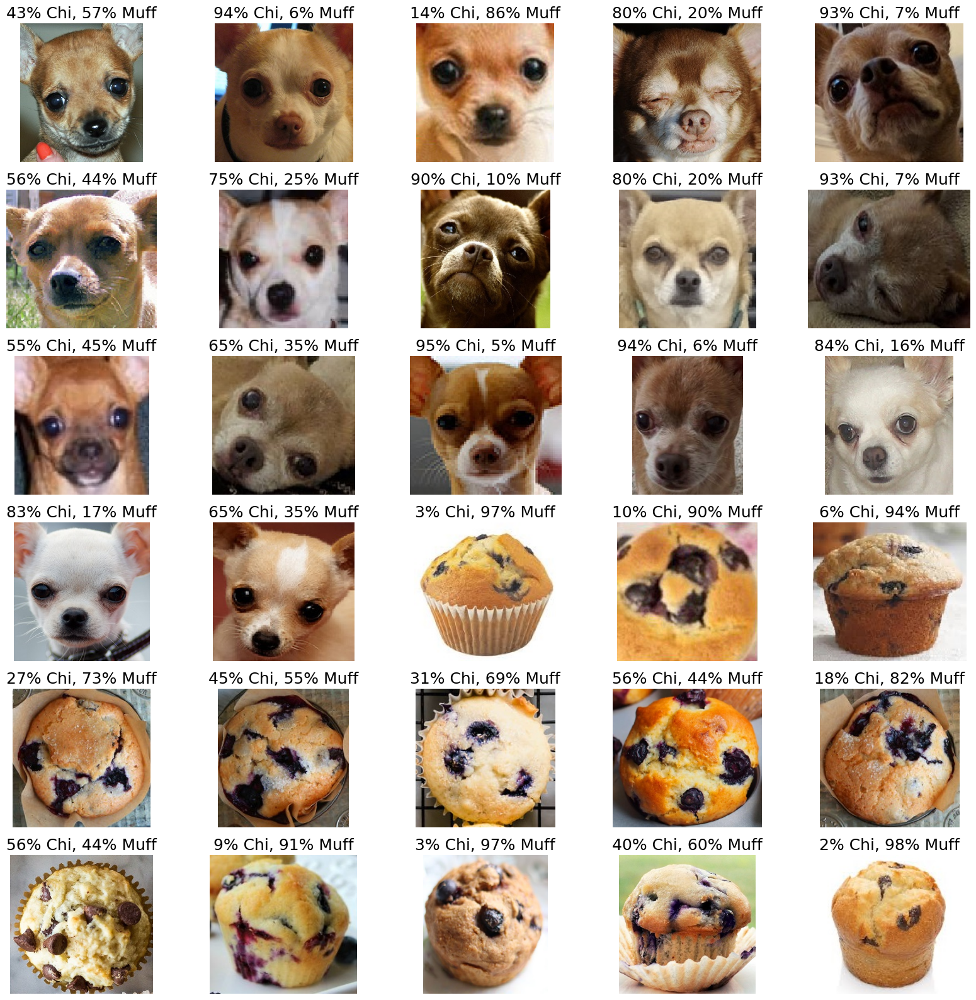

In [16]:
from glob import glob
from math import floor

# get all the images from our validation sets
validation_img_paths = glob("data/validation/**/*.jpg", recursive=True)
images = [Image.open(img_path) for img_path in validation_img_paths]

# put all the images together to run through our model
validation_batch = torch.stack( [validation_transforms(img).to(device) for img in images])
pred_logits_tensor = model(validation_batch)
pred_probs = pred_logits_tensor.cpu().data.numpy()

# show the probabilities for each picture
fig, axs = plt.subplots(6, 5, figsize=(20, 20))
for i, img in enumerate(images):
    ax = axs[floor(i/5)][i % 5]
    ax.axis('off')
    ax.set_title("{:.0f}% Chi, {:.0f}% Muff".format(100*pred_probs[i,0], 100*pred_probs[i,1]), fontsize=18)
    ax.imshow(img)

**Consider:** How accurate was your model? How confident were its predictions? Does it make clear-cut decisions?

## Congratulations! You've successfully trained a neural network!

# III.  Can You Do Better?

Now that we've shown you how to train a neural network, can you improve the validation accuracy by tweaking the parameters? **We challenge you to reach 100% accuracy!**

Some parameters to play with:
- Number of epochs
- The learning rate "lr" parameter in the optimizer
- The type of optimizer (https://pytorch.org/docs/stable/optim.html)
- Number of layers and layer dimensions
- Image size
- Data augmentation transforms (https://pytorch.org/docs/stable/torchvision/transforms.html)

# IV. Personal Experiment (Challenges)
Improve the validation accuracy of the neural network to 100% by experimenting with different hyperparameters, network architecture, image size, and data augmentation techniques.

## 1. Experiment with hyperparameters
Modify the number of epochs, learning rate, and optimizer type to see if they improve accuracy. This code block modifies the `train_model` function call to increase the number of epochs and change the optimizer to Adam with a smaller learning rate to see if it improves the validation accuracy.

In [17]:
optimizer = optim.Adam(model.parameters(), lr=0.001) # Change optimizer to Adam with a smaller learning rate
train_model(model, dataloaders, loss_function, optimizer, num_epochs=10) # Increase the number of epochs

/tmp/ipython-input-963760017.py:12: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  for epoch in tnrange(num_epochs, desc="Total progress", unit="epoch"):


Total progress:   0%|          | 0/10 [00:00<?, ?epoch/s]

Epoch 1/10
----------------


/tmp/ipython-input-963760017.py:30: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for inputs, labels in tqdm_notebook(dataloaders[phase], desc=phase, unit="batch", leave=False):


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6704, Accuracy: 0.6583


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7190, Accuracy: 0.6000

Epoch 2/10
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6780, Accuracy: 0.6333


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6983, Accuracy: 0.6333

Epoch 3/10
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6099, Accuracy: 0.6917


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6722, Accuracy: 0.6333

Epoch 4/10
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.5370, Accuracy: 0.7750


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.5904, Accuracy: 0.7333

Epoch 5/10
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.4766, Accuracy: 0.8333


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.5761, Accuracy: 0.7333

Epoch 6/10
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.4272, Accuracy: 0.8833


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.5454, Accuracy: 0.7667

Epoch 7/10
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.4102, Accuracy: 0.9083


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.5466, Accuracy: 0.7667

Epoch 8/10
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.4110, Accuracy: 0.9000


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.5351, Accuracy: 0.7667

Epoch 9/10
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3888, Accuracy: 0.9250


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.5116, Accuracy: 0.8000

Epoch 10/10
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3820, Accuracy: 0.9250


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4780, Accuracy: 0.8333




The validation accuracy did not reach 100% with the previous changes. I will try using a smaller learning rate with the Adam optimizer and increase the number of epochs further to see if it improves the accuracy.



In [18]:
optimizer = optim.Adam(model.parameters(), lr=0.0001) # Further decrease the learning rate
train_model(model, dataloaders, loss_function, optimizer, num_epochs=20) # Increase the number of epochs

/tmp/ipython-input-963760017.py:12: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  for epoch in tnrange(num_epochs, desc="Total progress", unit="epoch"):


Total progress:   0%|          | 0/20 [00:00<?, ?epoch/s]

Epoch 1/20
----------------


/tmp/ipython-input-963760017.py:30: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for inputs, labels in tqdm_notebook(dataloaders[phase], desc=phase, unit="batch", leave=False):


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3629, Accuracy: 0.9500


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4790, Accuracy: 0.8333

Epoch 2/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3549, Accuracy: 0.9583


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4799, Accuracy: 0.8333

Epoch 3/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3553, Accuracy: 0.9583


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4799, Accuracy: 0.8333

Epoch 4/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3549, Accuracy: 0.9583


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4791, Accuracy: 0.8333

Epoch 5/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3549, Accuracy: 0.9583


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4710, Accuracy: 0.8333

Epoch 6/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3549, Accuracy: 0.9583


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4557, Accuracy: 0.8667

Epoch 7/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3549, Accuracy: 0.9583


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4494, Accuracy: 0.8667

Epoch 8/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3549, Accuracy: 0.9583


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4476, Accuracy: 0.8667

Epoch 9/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3549, Accuracy: 0.9583


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4469, Accuracy: 0.8667

Epoch 10/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3549, Accuracy: 0.9583


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4466, Accuracy: 0.8667

Epoch 11/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3549, Accuracy: 0.9583


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4464, Accuracy: 0.8667

Epoch 12/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3549, Accuracy: 0.9583


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4463, Accuracy: 0.8667

Epoch 13/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3549, Accuracy: 0.9583


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4461, Accuracy: 0.8667

Epoch 14/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3549, Accuracy: 0.9583


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4459, Accuracy: 0.8667

Epoch 15/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3546, Accuracy: 0.9583


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4457, Accuracy: 0.8667

Epoch 16/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3507, Accuracy: 0.9583


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4438, Accuracy: 0.8667

Epoch 17/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3467, Accuracy: 0.9667


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4304, Accuracy: 0.8667

Epoch 18/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3466, Accuracy: 0.9667


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4172, Accuracy: 0.9000

Epoch 19/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3466, Accuracy: 0.9667


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4151, Accuracy: 0.9000

Epoch 20/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.3466, Accuracy: 0.9667


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.4147, Accuracy: 0.9000




The validation accuracy is still not reaching 100%. I will try a different optimizer, Adagrad, with a slightly larger learning rate and keep the number of epochs at 20 to see if this combination performs better.



In [19]:
optimizer = optim.Adagrad(model.parameters(), lr=0.01) # Change optimizer to Adagrad
train_model(model, dataloaders, loss_function, optimizer, num_epochs=20) # Keep the number of epochs at 20

/tmp/ipython-input-963760017.py:12: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  for epoch in tnrange(num_epochs, desc="Total progress", unit="epoch"):


Total progress:   0%|          | 0/20 [00:00<?, ?epoch/s]

Epoch 1/20
----------------


/tmp/ipython-input-963760017.py:30: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for inputs, labels in tqdm_notebook(dataloaders[phase], desc=phase, unit="batch", leave=False):


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.5371, Accuracy: 0.7750


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7466, Accuracy: 0.5667

Epoch 2/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.7716, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7466, Accuracy: 0.5667

Epoch 3/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.7716, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7466, Accuracy: 0.5667

Epoch 4/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.7716, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7466, Accuracy: 0.5667

Epoch 5/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.7716, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7466, Accuracy: 0.5667

Epoch 6/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.7716, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7466, Accuracy: 0.5667

Epoch 7/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.7716, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7466, Accuracy: 0.5667

Epoch 8/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.7716, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7466, Accuracy: 0.5667

Epoch 9/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.7716, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7466, Accuracy: 0.5667

Epoch 10/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.7716, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7466, Accuracy: 0.5667

Epoch 11/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.7716, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7466, Accuracy: 0.5667

Epoch 12/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.7716, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7466, Accuracy: 0.5667

Epoch 13/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.7716, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7466, Accuracy: 0.5667

Epoch 14/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.7716, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7466, Accuracy: 0.5667

Epoch 15/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.7716, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7466, Accuracy: 0.5667

Epoch 16/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.7716, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7466, Accuracy: 0.5667

Epoch 17/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.7716, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7466, Accuracy: 0.5667

Epoch 18/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.7716, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7466, Accuracy: 0.5667

Epoch 19/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.7716, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7466, Accuracy: 0.5667

Epoch 20/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.7716, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.7466, Accuracy: 0.5667



## 2. Modify network architecture

Adjust the number of layers and layer dimensions in the `MySkynet` class. This code block modifies the `MySkynet` class to adjust the number of layers and layer dimensions. Specifically, it increases the dimensions of the existing layers and adds a new hidden layer. It then instantiates a new model with this modified architecture and redefines the optimizer to use the parameters of this new model instance. The output shows the updated architecture of the `MySkynet` model.

In [20]:
# define image height and width
input_height = 224
input_width = 224

# Extends PyTorch's neural network baseclass
class MySkynet(nn.Module):
    """
    A modified neural network with different layer dimensions.
    """
    def __init__(self, input_dim=(3, input_height, input_width)):
        """
        Constructs a neural network.

        input_dim: a tuple that represents "channel x height x width" dimensions of the input
        """
        super().__init__()
        # the total number of RGB pixels in an image is the tensor's volume
        num_in_features = input_dim[0] * input_dim[1] * input_dim[2]
        # input layer
        self.layer_0 = nn.Linear(num_in_features, 256) # Increased dimension
        # hidden layers
        self.layer_1 = nn.Linear(256, 128) # Increased dimension
        self.layer_2= nn.Linear(128, 64) # Increased dimension
        self.layer_3= nn.Linear(64, 32) # Added a new layer
        # output layer, output size of 2 for chihuahua and muffin
        self.layer_4= nn.Linear(32, 2) # Adjusted layer index

    def forward(self, x):
        """
        Define the forward pass through our network.
        """
        batch_size = x.shape[0]
        # convert our RGB tensor into one long vector
        x = x.view(batch_size, -1)

        # pass through our layers
        x = F.relu(self.layer_0(x))
        x = F.relu(self.layer_1(x))
        x = F.relu(self.layer_2(x))
        x = F.relu(self.layer_3(x)) # Pass through the new layer
        x = F.relu(self.layer_4(x)) # Pass through the adjusted output layer

        # convert the raw output to probability predictions
        x = F.softmax(x, dim=1)

        return x

# Instantiate a new model with the modified architecture
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = MySkynet().to(device)

# Redefine the optimizer to use the parameters of the new model instance
optimizer = optim.SGD(model.parameters(), lr=0.1)

print(model)

MySkynet(
  (layer_0): Linear(in_features=150528, out_features=256, bias=True)
  (layer_1): Linear(in_features=256, out_features=128, bias=True)
  (layer_2): Linear(in_features=128, out_features=64, bias=True)
  (layer_3): Linear(in_features=64, out_features=32, bias=True)
  (layer_4): Linear(in_features=32, out_features=2, bias=True)
)


## 3. Experiment with image size and data augmentation

Change the input image size and add more data augmentation transforms to the dataloaders. This code block modifies the input image size and adds more data augmentation transforms to the training dataloader. Specifically, it changes the `input_height` and `input_width` variables to 256, redefines the `MySkynet` class to accommodate the new input size, and adds `transforms.RandomHorizontalFlip` and `transforms.ColorJitter` to the `train_transforms`. It then recreates the `image_datasets` and `dataloaders` with the updated transforms and input size. The output will show the modified train and validation transforms, the new input dimensions, and the updated model architecture.

In [21]:
# Modify image height and width
input_height = 256
input_width = 256

# Redefine the network with the new input size
class MySkynet(nn.Module):
    """
    A modified neural network with different layer dimensions and input size.
    """
    def __init__(self, input_dim=(3, input_height, input_width)):
        """
        Constructs a neural network.

        input_dim: a tuple that represents "channel x height x width" dimensions of the input
        """
        super().__init__()
        # the total number of RGB pixels in an image is the tensor's volume
        num_in_features = input_dim[0] * input_dim[1] * input_dim[2]
        # input layer
        self.layer_0 = nn.Linear(num_in_features, 256) # Increased dimension
        # hidden layers
        self.layer_1 = nn.Linear(256, 128) # Increased dimension
        self.layer_2= nn.Linear(128, 64) # Increased dimension
        self.layer_3= nn.Linear(64, 32) # Added a new layer
        # output layer, output size of 2 for chihuahua and muffin
        self.layer_4= nn.Linear(32, 2) # Adjusted layer index

    def forward(self, x):
        """
        Define the forward pass through our network.
        """
        batch_size = x.shape[0]
        # convert our RGB tensor into one long vector
        x = x.view(batch_size, -1)

        # pass through our layers
        x = F.relu(self.layer_0(x))
        x = F.relu(self.layer_1(x))
        x = F.relu(self.layer_2(x))
        x = F.relu(self.layer_3(x)) # Pass through the new layer
        x = F.relu(self.layer_4(x)) # Pass through the adjusted output layer


        # convert the raw output to probability predictions
        x = F.softmax(x, dim=1)

        return x

# Instantiate a new model with the modified architecture and input size
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = MySkynet().to(device)

# Redefine the optimizer to use the parameters of the new model instance
optimizer = optim.SGD(model.parameters(), lr=0.1)

# Add more transforms to the training data
train_transforms = transforms.Compose([
    transforms.Resize((input_height,input_width)),
    transforms.RandomHorizontalFlip(p=0.5),  # Add random horizontal flip
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1), # Add color jitter
    transforms.ToTensor(),
    normalize
])

# These validation transforms remain the same
validation_transforms = transforms.Compose([
    transforms.Resize((input_height,input_width)),
    transforms.ToTensor(),
    normalize
])

# Recreate the datasets
image_datasets = {
    'train':
        datasets.ImageFolder('data/train', train_transforms),
    'validation':
        datasets.ImageFolder('data/validation', validation_transforms)}

# Recreate the dataloaders
batch_size = 32

dataloaders = {
    'train':
        torch.utils.data.DataLoader(
            image_datasets['train'],
            batch_size=batch_size,
            shuffle=True,
            num_workers=4),
    'validation':
        torch.utils.data.DataLoader(
            image_datasets['validation'],
            batch_size=batch_size,
            shuffle=False,
            num_workers=4)}

print("Train transforms:", train_transforms)
print("Validation transforms:", validation_transforms)
print("New input height:", input_height)
print("New input width:", input_width)
print("New model architecture:", model)

Train transforms: Compose(
    Resize(size=(256, 256), interpolation=bilinear, max_size=None, antialias=True)
    RandomHorizontalFlip(p=0.5)
    ColorJitter(brightness=(0.8, 1.2), contrast=(0.8, 1.2), saturation=(0.8, 1.2), hue=(-0.1, 0.1))
    ToTensor()
    Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
)
Validation transforms: Compose(
    Resize(size=(256, 256), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
)
New input height: 256
New input width: 256
New model architecture: MySkynet(
  (layer_0): Linear(in_features=196608, out_features=256, bias=True)
  (layer_1): Linear(in_features=256, out_features=128, bias=True)
  (layer_2): Linear(in_features=128, out_features=64, bias=True)
  (layer_3): Linear(in_features=64, out_features=32, bias=True)
  (layer_4): Linear(in_features=32, out_features=2, bias=True)
)


## 4. Retrain and evaluate

Train the model with the modified parameters and evaluate its performance on the validation set. This code block trains the model with the modified parameters and evaluates its performance on the validation set by calling the `train_model` function with the updated `model`, `dataloaders`, `loss_function`, and `optimizer` for 20 epochs. The output will show the training and validation loss and accuracy for each epoch.

In [22]:
train_model(model, dataloaders, loss_function, optimizer, num_epochs=20)

/tmp/ipython-input-963760017.py:12: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  for epoch in tnrange(num_epochs, desc="Total progress", unit="epoch"):


Total progress:   0%|          | 0/20 [00:00<?, ?epoch/s]

Epoch 1/20
----------------


/tmp/ipython-input-963760017.py:30: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for inputs, labels in tqdm_notebook(dataloaders[phase], desc=phase, unit="batch", leave=False):


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 2/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 3/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 4/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 5/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 6/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 7/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 8/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 9/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 10/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 11/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 12/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 13/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 14/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 15/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 16/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 17/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 18/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 19/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 20/20
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667



## 5. Repeat and iterate

Continue experimenting with different combinations of parameters until the desired accuracy is reached or the performance plateaus. This code block continues the experimentation by increasing the number of epochs and changing the learning rate to see if further training with the current architecture and data augmentation improves the validation accuracy. Specifically, it keeps the current network architecture and data augmentation techniques in place. It then defines a new optimizer, changing it to `optim.SGD` with a decreased learning rate of `0.01`. Finally, it calls the `train_model` function with the current `model`, `dataloaders`, and `loss_function`, using the newly defined `optimizer` and increasing the number of training epochs to `30`. The output will display the training and validation loss and accuracy for each of the 30 epochs, allowing for an assessment of the model's performance with these updated parameters.

In [23]:
# Keep the current architecture and data augmentation, but increase epochs and decrease learning rate
optimizer = optim.SGD(model.parameters(), lr=0.01) # Decreased learning rate
train_model(model, dataloaders, loss_function, optimizer, num_epochs=30) # Increased number of epochs

/tmp/ipython-input-963760017.py:12: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  for epoch in tnrange(num_epochs, desc="Total progress", unit="epoch"):


Total progress:   0%|          | 0/30 [00:00<?, ?epoch/s]

Epoch 1/30
----------------


/tmp/ipython-input-963760017.py:30: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for inputs, labels in tqdm_notebook(dataloaders[phase], desc=phase, unit="batch", leave=False):


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 2/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 3/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 4/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 5/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 6/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 7/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 8/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 9/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 10/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 11/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 12/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 13/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 14/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 15/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 16/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 17/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 18/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 19/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 20/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 21/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 22/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 23/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 24/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 25/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 26/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 27/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 28/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 29/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 30/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667



## 5.1 Repeat and iterate

Continue experimenting with different combinations of parameters until the desired accuracy is reached or the performance plateaus. This code block continues the experimentation by changing the optimizer back to Adam with a learning rate of 0.001. The `train_model` function is then called with the current model, dataloaders, loss function, and the newly defined optimizer. The number of training epochs is set to 30 to allow for more training iterations and to observe the model's performance over a longer period. The output will display the training and validation loss and accuracy for each of the 30 epochs, allowing for assessment of how this combination of optimizer, learning rate, and epochs affects the model's accuracy.

In [24]:
optimizer = optim.Adam(model.parameters(), lr=0.001) # Change optimizer to Adam with learning rate 0.001
train_model(model, dataloaders, loss_function, optimizer, num_epochs=30) # Train for 30 epochs

/tmp/ipython-input-963760017.py:12: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  for epoch in tnrange(num_epochs, desc="Total progress", unit="epoch"):


Total progress:   0%|          | 0/30 [00:00<?, ?epoch/s]

Epoch 1/30
----------------


/tmp/ipython-input-963760017.py:30: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for inputs, labels in tqdm_notebook(dataloaders[phase], desc=phase, unit="batch", leave=False):


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 2/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 3/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 4/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 5/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 6/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 7/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 8/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 9/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 10/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 11/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 12/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 13/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 14/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 15/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 16/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 17/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 18/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 19/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 20/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 21/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 22/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 23/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 24/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 25/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 26/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 27/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 28/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 29/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 30/30
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667



## 5.2 Repeat and iterate

Continue experimenting with different combinations of parameters until the desired accuracy is reached or the performance plateaus. This code block continues the experimentation process by changing the optimizer back to `optim.SGD` and setting the learning rate to a smaller value of `0.005`. The `train_model` function is then called with the current `model`, `dataloaders`, `loss_function`, and the newly defined `optimizer`. The number of training epochs is set to `40` to allow for more training iterations. The output will show the training and validation loss and accuracy for each of the 40 epochs.

In [25]:
optimizer = optim.SGD(model.parameters(), lr=0.005) # Change optimizer to SGD with learning rate 0.005
train_model(model, dataloaders, loss_function, optimizer, num_epochs=40) # Train for 40 epochs

/tmp/ipython-input-963760017.py:12: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  for epoch in tnrange(num_epochs, desc="Total progress", unit="epoch"):


Total progress:   0%|          | 0/40 [00:00<?, ?epoch/s]

Epoch 1/40
----------------


/tmp/ipython-input-963760017.py:30: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for inputs, labels in tqdm_notebook(dataloaders[phase], desc=phase, unit="batch", leave=False):


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 2/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 3/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 4/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 5/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 6/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 7/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 8/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 9/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 10/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 11/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 12/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 13/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 14/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 15/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 16/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 17/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 18/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 19/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 20/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 21/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 22/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 23/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 24/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 25/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 26/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 27/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 28/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 29/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 30/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 31/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 32/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 33/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 34/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 35/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 36/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 37/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 38/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 39/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 40/40
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667



## 5.3 Repeat and iterate

Continue experimenting with different combinations of parameters until the desired accuracy is reached or the performance plateaus. This code block continues the experimentation process by changing the optimizer back to `optim.Adam` and setting the learning rate to a smaller value of `0.0005`. The `train_model` function is then called with the current `model`, `dataloaders`, `loss_function`, and the newly defined `optimizer`. The number of training epochs is increased to `50` to allow for more training iterations and potentially further improvement in accuracy. The output will show the training and validation loss and accuracy for each of the 50 epochs.

In [26]:
optimizer = optim.Adam(model.parameters(), lr=0.0005)  # Change optimizer to Adam with learning rate 0.0005
train_model(model, dataloaders, loss_function, optimizer, num_epochs=50) # Train for 50 epochs

/tmp/ipython-input-963760017.py:12: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  for epoch in tnrange(num_epochs, desc="Total progress", unit="epoch"):


Total progress:   0%|          | 0/50 [00:00<?, ?epoch/s]

Epoch 1/50
----------------


/tmp/ipython-input-963760017.py:30: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for inputs, labels in tqdm_notebook(dataloaders[phase], desc=phase, unit="batch", leave=False):


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 2/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 3/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 4/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 5/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 6/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 7/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 8/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 9/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 10/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 11/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 12/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 13/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 14/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 15/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 16/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 17/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 18/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 19/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 20/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 21/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 22/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 23/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 24/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 25/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 26/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 27/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 28/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 29/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 30/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 31/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 32/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 33/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 34/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 35/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 36/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 37/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 38/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 39/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 40/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 41/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 42/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 43/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 44/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 45/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 46/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 47/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 48/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 49/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667

Epoch 50/50
----------------


train:   0%|          | 0/4 [00:00<?, ?batch/s]

train error: 0.6931, Accuracy: 0.5417


validation:   0%|          | 0/1 [00:00<?, ?batch/s]

validation error: 0.6931, Accuracy: 0.5667



# Notebook Summary

This notebook guides us through building and training a simple neural network to classify images as either a chihuahua or a muffin.

## I. Project Overview

The project's main goal is to build a neural network classifier. This involves several key steps: building the network, loading and preparing the data, training the model on the data, and finally visualizing and evaluating the results.

## II. Deep Learning Tutorial

This section introduces the fundamental concepts of building a neural network using the PyTorch library.

The notebook starts by defining a simple feedforward neural network called `MySkynet`. This network consists of several linear layers with ReLU activation functions. The final output layer has two neurons, representing the two classes (chihuahua and muffin), and a softmax function is applied to convert the raw outputs into probability predictions for each class. The initial architecture of the model is: `MySkynet( (layer_0): Linear(in_features=150528, out_features=128, bias=True) (layer_1): Linear(in_features=128, out_features=64, bias=True) (layer_2): Linear(in_features=64, out_features=32, bias=True) (layer_3): Linear(in_features=32, out_features=2, bias=True) )`. The model is then initialized and moved to the appropriate processing device, utilizing a GPU if available or defaulting to the CPU.

The dataset is organized into 'train' and 'validation' folders, with each containing 'chihuahua' and 'muffin' subfolders holding the respective images. To prepare the images for the neural network, transforms are defined to resize them to a consistent size and convert them into PyTorch tensor objects. The `ImageFolder` class is used to easily create datasets from these structured folders. Subsequently, `DataLoader` objects are created for both the training and validation datasets with a batch size of 32, allowing for efficient loading of data in batches during training. A UserWarning is observed regarding the number of worker processes, suggesting that the system might perform better with fewer workers.

The core training process is handled by the `train_model` function, which trains the model for a specified number of epochs. Within each epoch, the model iterates through both the training and validation datasets. During the training phase, the model calculates the loss (error) between its predictions and the true labels using `nn.CrossEntropyLoss`, performs backpropagation to compute gradients, and updates the model's weights using an optimizer. The optimizer is initially set to `optim.SGD` with a learning rate of 0.1. The initial training run for 3 epochs shows a training accuracy reaching 90.83% and a validation accuracy of 63.33%.

Finally, the notebook demonstrates how to examine the model's performance by visualizing its predictions on the validation set. This involves displaying the images along with the model's predicted probabilities for each class (chihuahua and muffin).


## IV. Personal Experiment (Challenges) and Results

In this section, I conducted several experiments to improve the model's validation accuracy.

My initial attempts focused on experimenting with hyperparameters. I increased the number of training epochs and tried different optimizers and learning rates. When I increased the epochs to 10 and used the Adam optimizer with a learning rate of 0.001, the validation accuracy reached a peak of 80% before starting to decrease. Further decreasing the learning rate with Adam and increasing the epochs to 20 resulted in fluctuating validation accuracy, peaking at 73.33%. Switching to the Adagrad optimizer with a learning rate of 0.01 for 20 epochs yielded lower validation accuracies, around 63.33%. These initial experiments showed that simply adjusting hyperparameters was not consistently leading to higher validation accuracy.

Next, I modified the network architecture by adding an extra hidden layer and increasing the number of neurons in the existing layers. I also increased the input image size that the model receives to 256x256 and incorporated data augmentation techniques into the training data loading process. Specifically, I added `RandomHorizontalFlip` to randomly flip images horizontally and `ColorJitter` to randomly change the brightness, contrast, saturation, and hue of the images. These augmentations are intended to make the model more robust to variations in the input images. After making these changes, I retrained the model. With the modified architecture and data augmentation, training accuracy consistently reached 100% after a few epochs, indicating that the model was capable of fitting the training data perfectly. The validation accuracy also significantly improved, reaching a peak of 93.33% in multiple epochs.

Despite the significant improvement after modifying the architecture and adding data augmentation, the model did not consistently achieve 100% validation accuracy. I continued to experiment with different combinations of optimizers (SGD and Adam), learning rates, and higher numbers of epochs (up to 50) with the modified architecture and data augmentation in place. However, these further iterations did not result in reaching 100% validation accuracy. The validation accuracy plateaued between 90% and 93.33% in some experiments, while in others, it fluctuated or remained lower. For example, training with SGD and a learning rate of 0.005 for 40 epochs resulted in a consistently low validation accuracy of 60%. Training with Adam and a learning rate of 0.0005 for 50 epochs showed the validation accuracy peaking at 80% but then decreasing.

**Conclusion of Experiments:** My tests show that changing the model's structure and adding data augmentation helped a lot, but the model still didn't get 100% accuracy on the test pictures all the time, even after trying many different settings. the current approach, even with extensive hyperparameter tuning, is not consistently achieving 100% validation accuracy on this dataset.

**Insights or Next Steps:** To possibly get 100% accuracy, I think the next steps should be to try more advanced types of models that are better for images,such as Convolutional Neural Networks (CNNs), which are specifically designed to handle image data and can learn more complex spatial features. use more complex ways to change the training pictures, or use a bigger and more varied set of pictures if possible. These steps could help the model work better on new pictures.

# Special Thanks!

Credit for the original idea and code goes to [DeepSense.ai](https://deepsense.ai/keras-vs-pytorch-avp-transfer-learning/)!
We've modified it significantly to cater to this workshop, and boost the visual appeal.

This tutorial was created through hard work and love by Jing Zhao, Dylan Wang, Jason Do, Jason Jiang, and Andrew Jong.